# Regression Problem

In [1]:
# Load the data
import pandas as pd
df=pd.read_csv("boston.csv")

In [2]:
df.head()

,CRIM,ZN,INDUS,NOX,RM,AGE,DIS,RAD,TAX,PTRATIO,B,LSTAT,HOUSEPRICE
0,0.00632,18.0,2.31,0.538,6.575,65.2,4.0900,1,296,15.3,396.90,4.98,24.0
1,0.02731,0.0,7.07,0.469,6.421,78.9,4.9671,2,242,17.8,396.90,9.14,21.6
2,0.02729,0.0,7.07,0.469,7.185,61.1,4.9671,2,242,17.8,392.83,4.03,34.7
3,0.03237,0.0,2.18,0.458,6.998,45.8,6.0622,3,222,18.7,394.63,2.94,33.4
4,0.06905,0.0,2.18,0.458,7.147,54.2,6.0622,3,222,18.7,396.90,5.33,36.2


In [3]:
!pip install pandas-profiling

Defaulting to user installation because normal site-packages is not writeable
You should consider upgrading via the '/usr/local/bin/python3 -m pip install --upgrade pip' command.


# EDA

In [4]:
from pandas_profiling import ProfileReport

In [5]:
ProfileReport(df)

Summarize dataset:   0%|          | 0/27 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

In [6]:
# separating outcome and features
x=df.drop(columns='HOUSEPRICE')
y=df.HOUSEPRICE

# split the data into train and test
from sklearn.model_selection import train_test_split
x_train,x_test,y_train,y_test=train_test_split(x,y,random_state=0)

#Standardise data
from sklearn.preprocessing import StandardScaler
st=StandardScaler()
st.fit(x_train)
st.fit(x_test)

x_train_std=st.transform(x_train)
x_test_std=st.transform(x_test)

In [7]:
x_train_std.shape

(379, 12)

In [8]:
!pip install livelossplot

Defaulting to user installation because normal site-packages is not writeable
You should consider upgrading via the '/usr/local/bin/python3 -m pip install --upgrade pip' command.


In [9]:
# Build the model
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Input, Dense
from livelossplot import PlotLossesKerasTF

In [10]:
model=Sequential()
model.add(Input(shape=(12,),name="Input Layer"))
model.add(Dense(15,activation='relu',name="Hidden1"))
model.add(Dense(15,activation='relu',name="Hidden2"))
model.add(Dense(1,activation='relu',name='OutputLayer'))
model.compile(loss='mse',optimizer='adam')

In [11]:
model.summary()

Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 Hidden1 (Dense)             (None, 15)                195       
                                                                 
 Hidden2 (Dense)             (None, 15)                240       
                                                                 
 OutputLayer (Dense)         (None, 1)                 16        
                                                                 
Total params: 451
Trainable params: 451
Non-trainable params: 0
_________________________________________________________________


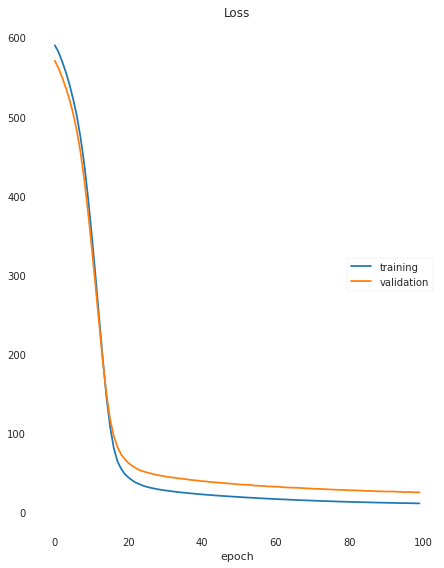

Loss
	training         	 (min:   11.247, max:  590.344, cur:   11.247)
	validation       	 (min:   25.215, max:  570.793, cur:   25.215)
12/12 [==============================] - 0s 39ms/step - loss: 11.2472 - val_loss: 25.2153


In [12]:
# train the model
model.fit(x_train_std,y_train,epochs=100,validation_data=(x_test_std,y_test),callbacks=[PlotLossesKerasTF()])

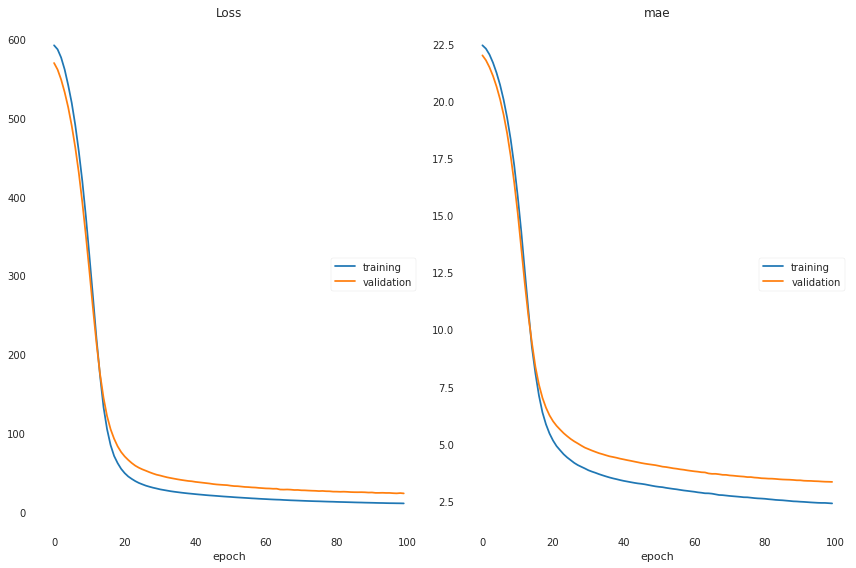

Loss
	training         	 (min:   10.870, max:  592.132, cur:   10.870)
	validation       	 (min:   23.565, max:  569.684, cur:   23.565)
mae
	training         	 (min:    2.398, max:   22.441, cur:    2.398)
	validation       	 (min:    3.339, max:   22.001, cur:    3.339)
12/12 [==============================] - 1s 60ms/step - loss: 10.8699 - mae: 2.3982 - val_loss: 23.5646 - val_mae: 3.3385


In [13]:
model=Sequential()
model.add(Input(shape=(12,),name="Input Layer"))
model.add(Dense(15,activation='relu',name="Hidden1"))
model.add(Dense(15,activation='relu',name="Hidden2"))
model.add(Dense(1,activation='relu',name='OutputLayer'))
model.compile(loss='mse',optimizer='adam',metrics=['mae'])
# train the model
model.fit(x_train_std,y_train,epochs=100,validation_data=(x_test_std,y_test),callbacks=[PlotLossesKerasTF()])

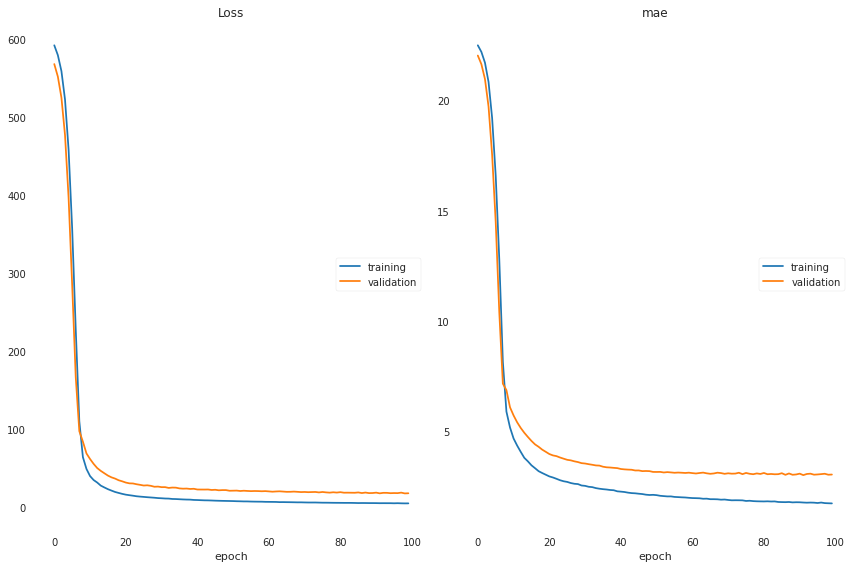

Loss
	training         	 (min:    5.237, max:  591.627, cur:    5.279)
	validation       	 (min:   18.017, max:  567.597, cur:   18.198)
mae
	training         	 (min:    1.750, max:   22.494, cur:    1.750)
	validation       	 (min:    3.030, max:   22.030, cur:    3.056)
12/12 [==============================] - 1s 45ms/step - loss: 5.2793 - mae: 1.7498 - val_loss: 18.1975 - val_mae: 3.0562


In [14]:
# Increase number of layers
model=Sequential()
model.add(Input(shape=(12,),name="Input Layer"))
model.add(Dense(15,activation='relu',name="Hidden1"))
model.add(Dense(15,activation='relu',name="Hidden2"))
model.add(Dense(25,activation='relu',name="Hidden3"))
model.add(Dense(30,activation='relu',name="Hidden4"))
model.add(Dense(1,activation='relu',name='OutputLayer'))
model.compile(loss='mse',optimizer='adam',metrics=['mae'])
# train the model
model.fit(x_train_std,y_train,epochs=100,validation_data=(x_test_std,y_test),callbacks=[PlotLossesKerasTF()])

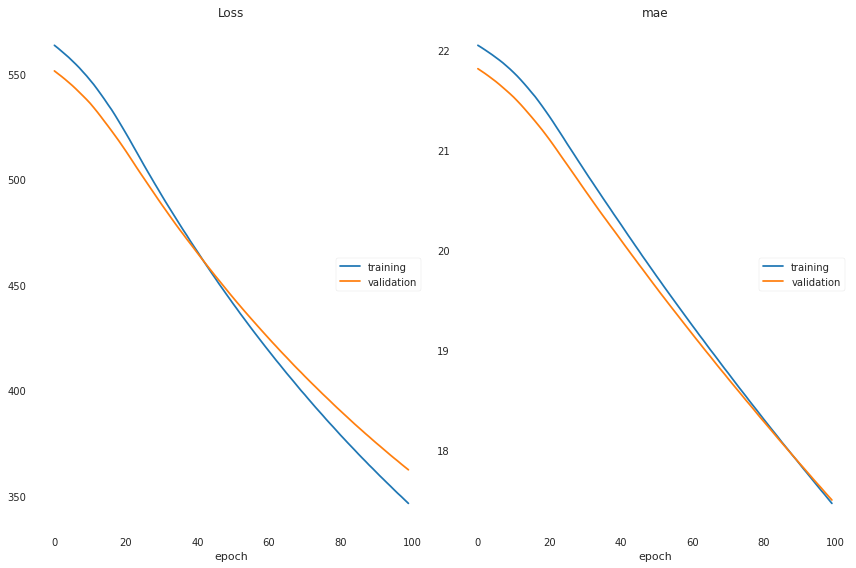

Loss
	training         	 (min:  346.510, max:  563.681, cur:  346.510)
	validation       	 (min:  362.440, max:  551.538, cur:  362.440)
mae
	training         	 (min:   17.469, max:   22.050, cur:   17.469)
	validation       	 (min:   17.503, max:   21.816, cur:   17.503)
12/12 [==============================] - 1s 48ms/step - loss: 346.5095 - mae: 17.4689 - val_loss: 362.4398 - val_mae: 17.5029


In [15]:
# Perceptron
model=Sequential()
model.add(Input(shape=(12,),name="Input Layer"))
model.add(Dense(1,activation='relu',name='OutputLayer'))
model.compile(loss='mse',optimizer='adam',metrics=['mae'])
# train the model
model.fit(x_train_std,y_train,epochs=100,validation_data=(x_test_std,y_test),callbacks=[PlotLossesKerasTF()])

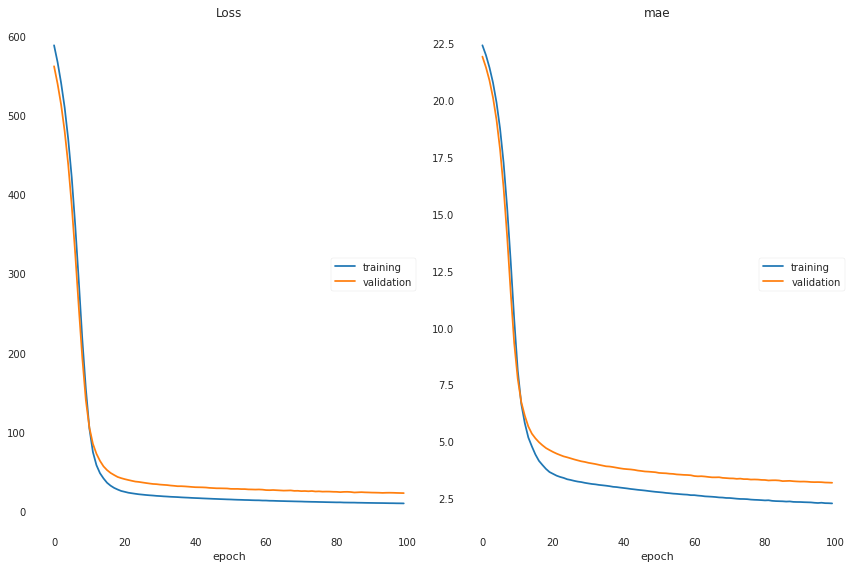

Loss
	training         	 (min:   10.151, max:  588.006, cur:   10.151)
	validation       	 (min:   23.125, max:  561.578, cur:   23.125)
mae
	training         	 (min:    2.282, max:   22.407, cur:    2.282)
	validation       	 (min:    3.189, max:   21.911, cur:    3.189)
12/12 [==============================] - 1s 49ms/step - loss: 10.1508 - mae: 2.2821 - val_loss: 23.1245 - val_mae: 3.1888


In [16]:
# Increase number of layers
model=Sequential()
model.add(Input(shape=(12,),name="Input Layer"))
model.add(Dense(15,activation='relu',name="Hidden1"))
model.add(Dense(50,activation='relu',name="Hidden2"))
model.add(Dense(1,activation='relu',name='OutputLayer'))
model.compile(loss='mse',optimizer='adam',metrics=['mae'])
# train the model
model.fit(x_train_std,y_train,epochs=100,validation_data=(x_test_std,y_test),callbacks=[PlotLossesKerasTF()])

In [17]:
model.predict(x_test_std)

array([[23.601566 ],
       [26.487478 ],
       [23.841679 ],
       [10.909794 ],
       [17.79975  ],
       [19.270306 ],
       [22.348341 ],
       [21.410364 ],
       [19.349255 ],
       [19.599836 ],
       [ 4.9987664],
       [12.118351 ],
       [15.372447 ],
       [10.080387 ],
       [46.81256  ],
       [33.66658  ],
       [22.728464 ],
       [40.796062 ],
       [30.680916 ],
       [22.060617 ],
       [23.366093 ],
       [21.058235 ],
       [21.373594 ],
       [26.33385  ],
       [22.957916 ],
       [23.36508  ],
       [17.480425 ],
       [16.735785 ],
       [44.109493 ],
       [15.414943 ],
       [16.142313 ],
       [18.86709  ],
       [16.744236 ],
       [20.107738 ],
       [27.20206  ],
       [19.628124 ],
       [ 6.5644417],
       [25.498981 ],
       [14.777559 ],
       [11.791598 ],
       [26.97869  ],
       [21.78846  ],
       [19.508102 ],
       [17.879686 ],
       [22.992037 ],
       [25.050371 ],
       [18.4817   ],
       [18.92

In [18]:
y_test

329    22.6
371    50.0
219    23.0
403     8.3
78     21.2
       ... 
49     19.4
498    21.2
309    20.3
124    18.8
306    33.4
Name: HOUSEPRICE, Length: 127, dtype: float64

In [19]:
# save model
model.save("BostonModel.h5")

In [26]:
df_new=pd.read_csv("boston new data.csv")

In [27]:
df_new

,CRIM,ZN,INDUS,CHAS,NOX,RM,AGE,DIS,RAD,TAX,PTRATIO,B,LSTAT
0,0.653,16,2.2,0,0.538,6.575,65.2,4.09,1,296,15.3,396.9,4.98
1,0.005,0,3.4,0,0.600,7.000,45.0,5.00,2,300,17.0,300.0,6.00


In [28]:
df_new.drop(columns="CHAS",inplace=True)

In [29]:
df_new_std=st.fit_transform(df_new)

In [31]:
#load and use the model
from tensorflow.keras.models import load_model
boston_model = load_model("BostonModel.h5")
boston_model.predict(df_new_std)

array([[23.091084],
       [15.297439]], dtype=float32)

In [32]:
model.predict(df_new_std)

array([[23.091084],
       [15.297439]], dtype=float32)